**About Dataset**

**Description:**
Breast cancer is the most common cancer amongst women in the world. It accounts for 25% of all cancer cases, and affected over 2.1 Million people in 2015 alone. It starts when cells in the breast begin to grow out of control. These cells usually form tumors that can be seen via X-ray or felt as lumps in the breast area.

The key challenges against it’s detection is how to classify tumors into malignant (cancerous) or benign(non cancerous). We ask you to complete the analysis of classifying these tumors using machine learning (with SVMs) and the Breast Cancer Wisconsin (Diagnostic) Dataset.

Acknowledgements:
This dataset has been referred from Kaggle.
link : https://www.kaggle.com/datasets/yasserh/breast-cancer-dataset



**Problem Statement:** Breast Cancer Classification using **Support Vector Machine (SVM)**

Breast cancer is one of the most common and life-threatening diseases affecting women worldwide. Early diagnosis significantly improves the chances of successful treatment and recovery. However, manual diagnosis based on biopsy or imaging can be time-consuming and subject to human error.

This project aims to develop a binary classification model using Support Vector Machine (SVM) to automatically distinguish between malignant and benign breast tumors using the Breast Cancer Wisconsin dataset. The goal is to create a reliable, efficient, and accurate model that can assist healthcare professionals in decision-making.

**Objectives:**

Load and preprocess the Breast Cancer dataset to make it suitable for binary classification.

Train SVM classifiers using both linear and RBF kernels.

Visualize the decision boundaries using 2D projection of the data.

Tune hyperparameters like C and gamma using GridSearchCV for better performance.

Evaluate model performance using cross-validation, confusion matrix, and classification report

# Importing require Libraries 

In [28]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import LabelEncoder , StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV,cross_val_score

from sklearn.svm import SVC
from sklearn.decomposition import PCA

from sklearn.metrics import confusion_matrix, classification_report ,accuracy_score

# import the Breast Cancer Dataset

In [29]:
breast_dataset = pd.read_csv("breast-cancer.csv")

In [30]:
print("Top 10 rows :\n")
breast_dataset.head(10)

Top 10 rows :



,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678
5,843786,M,12.45,15.70,82.57,477.1,0.12780,0.17000,0.15780,0.08089,...,15.47,23.75,103.40,741.6,0.1791,0.5249,0.5355,0.1741,0.3985,0.12440
6,844359,M,18.25,19.98,119.60,1040.0,0.09463,0.10900,0.11270,0.07400,...,22.88,27.66,153.20,1606.0,0.1442,0.2576,0.3784,0.1932,0.3063,0.08368
7,84458202,M,13.71,20.83,90.20,577.9,0.11890,0.16450,0.09366,0.05985,...,17.06,28.14,110.60,897.0,0.1654,0.3682,0.2678,0.1556,0.3196,0.11510
8,844981,M,13.00,21.82,87.50,519.8,0.12730,0.19320,0.18590,0.09353,...,15.49,30.73,106.20,739.3,0.1703,0.5401,0.5390,0.2060,0.4378,0.10720
9,84501001,M,12.46,24.04,83.97,475.9,0.11860,0.23960,0.22730,0.08543,...,15.09,40.68,97.65,711.4,0.1853,1.0580,1.1050,0.2210,0.4366,0.20750


In [4]:
Total_Rows = breast_dataset.shape[0]
Total_Cols = breast_dataset.shape[1]
print("Total Rows is :",Total_Rows)
print("Total columns is :", Total_Cols)

Total Rows is : 569
Total columns is : 32


In [5]:
print( "\n Information about the Titanic dataset : \n " )
breast_dataset.info()


 Information about the Titanic dataset : 
 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-nu

# Columns distribution

In [6]:
feature_cols =  breast_dataset.columns.tolist()
print("Total columns is here :\n", breast_dataset.columns.tolist())

Total columns is here :
 ['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst']


In [7]:
numerical_col = breast_dataset.select_dtypes(include=["int64","float64"]).columns
print("Total Numerical columns list is here :\n", numerical_col)
print("\nTotal Numerical columns is here :\n" ,numerical_col.value_counts().sum())

Total Numerical columns list is here :
 Index(['id', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean',
       'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

Total Numerical columns is here :
 31


In [8]:
categorical_col = breast_dataset.select_dtypes(include=["O"]).columns
print("Total categorical columns  list is here :\n", categorical_col)
print("\nTotal categorical columns is here :\n" ,categorical_col.value_counts().sum())

Total categorical columns  list is here :
 Index(['diagnosis'], dtype='object')

Total categorical columns is here :
 1


# basic statistics about the Iris data :

In [9]:
breast_dataset.describe().T

,count,mean,std,min,25%,50%,75%,max
id,569.0,3.037183e+07,1.250206e+08,8670.000000,869218.000000,906024.000000,8.813129e+06,9.113205e+08
radius_mean,569.0,1.412729e+01,3.524049e+00,6.981000,11.700000,13.370000,1.578000e+01,2.811000e+01
texture_mean,569.0,1.928965e+01,4.301036e+00,9.710000,16.170000,18.840000,2.180000e+01,3.928000e+01
perimeter_mean,569.0,9.196903e+01,2.429898e+01,43.790000,75.170000,86.240000,1.041000e+02,1.885000e+02
area_mean,569.0,6.548891e+02,3.519141e+02,143.500000,420.300000,551.100000,7.827000e+02,2.501000e+03
smoothness_mean,569.0,9.636028e-02,1.406413e-02,0.052630,0.086370,0.095870,1.053000e-01,1.634000e-01
compactness_mean,569.0,1.043410e-01,5.281276e-02,0.019380,0.064920,0.092630,1.304000e-01,3.454000e-01
concavity_mean,569.0,8.879932e-02,7.971981e-02,0.000000,0.029560,0.061540,1.307000e-01,4.268000e-01
concave points_mean,569.0,4.891915e-02,3.880284e-02,0.000000,0.020310,0.033500,7.400000e-02,2.012000e-01
symmetry_mean,569.0,1.811619e-01,2.741428e-02,0.106000,0.161900,0.179200,1.957000e-01,3.040000e-01


In [10]:
breast_dataset.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
id,569.0,NaN,NaN,NaN,30371831.432337,125020585.612224,8670.0,869218.0,906024.0,8813129.0,911320502.0
diagnosis,569,2,B,357,NaN,NaN,NaN,NaN,NaN,NaN,NaN
radius_mean,569.0,NaN,NaN,NaN,14.127292,3.524049,6.981,11.7,13.37,15.78,28.11
texture_mean,569.0,NaN,NaN,NaN,19.289649,4.301036,9.71,16.17,18.84,21.8,39.28
perimeter_mean,569.0,NaN,NaN,NaN,91.969033,24.298981,43.79,75.17,86.24,104.1,188.5
area_mean,569.0,NaN,NaN,NaN,654.889104,351.914129,143.5,420.3,551.1,782.7,2501.0
smoothness_mean,569.0,NaN,NaN,NaN,0.09636,0.014064,0.05263,0.08637,0.09587,0.1053,0.1634
compactness_mean,569.0,NaN,NaN,NaN,0.104341,0.052813,0.01938,0.06492,0.09263,0.1304,0.3454
concavity_mean,569.0,NaN,NaN,NaN,0.088799,0.07972,0.0,0.02956,0.06154,0.1307,0.4268
concave points_mean,569.0,NaN,NaN,NaN,0.048919,0.038803,0.0,0.02031,0.0335,0.074,0.2012


In [11]:
breast_dataset.describe(include="O").T

,count,unique,top,freq
diagnosis,569,2,B,357


# Visualizations:

In [12]:
sns.pairplot(breast_dataset)
plt.tight_layout()
plt.show()

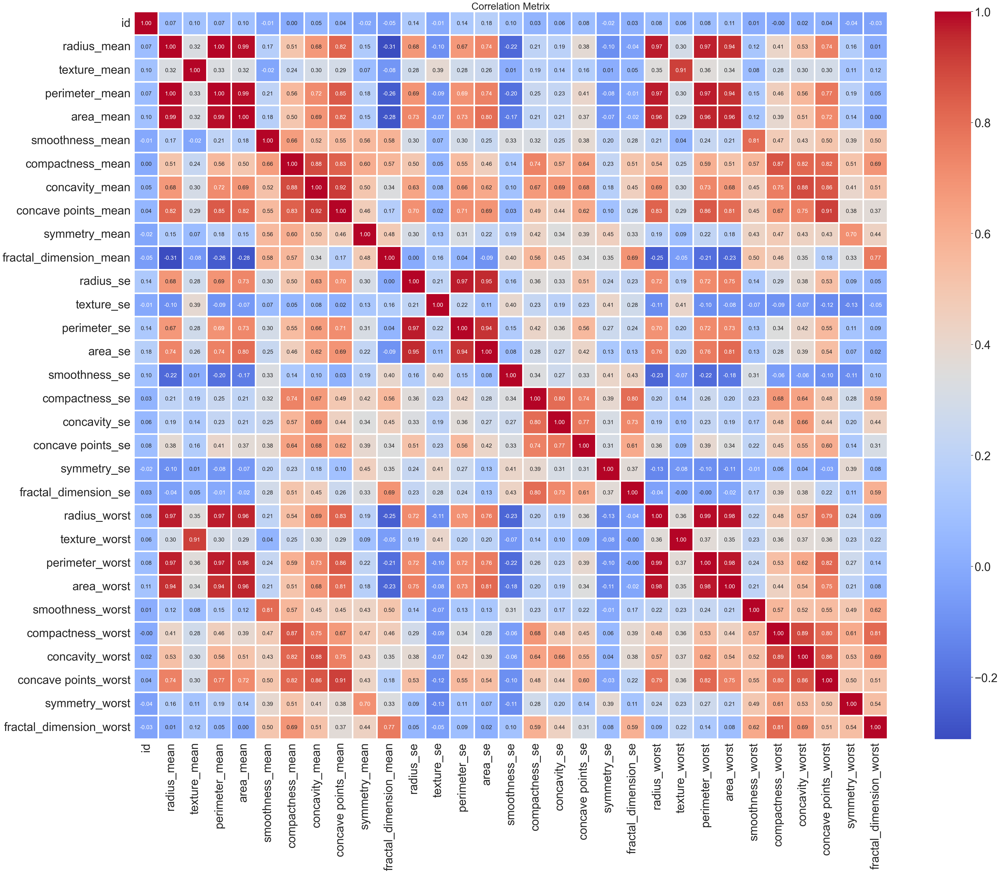

In [13]:
correlation = breast_dataset.corr(numeric_only=True)

plt.figure(figsize=(43,35))
sns.set(font_scale=3.0)
sns.heatmap(correlation ,linewidths="4" ,annot=True ,cmap="coolwarm",       
            annot_kws={"size": 16}, fmt=".2f",)
plt.title("Correlation Metrix" , fontsize=28)
plt.tight_layout()
plt.show()

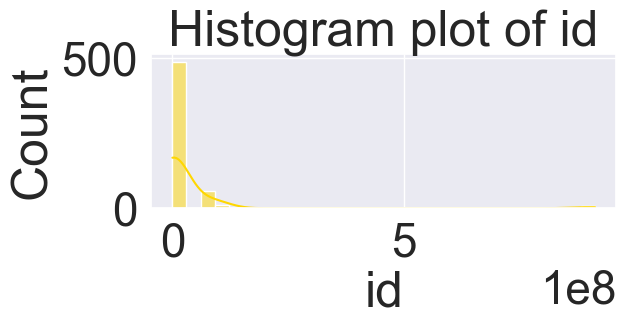

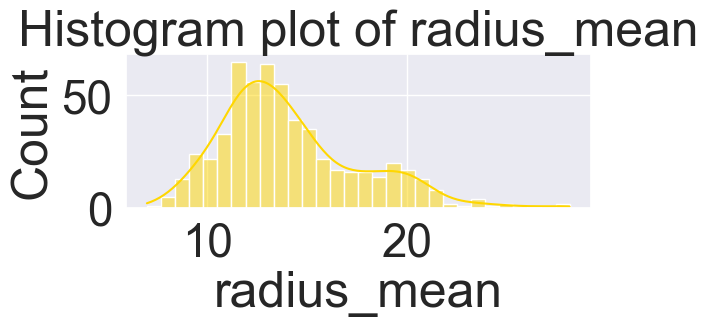

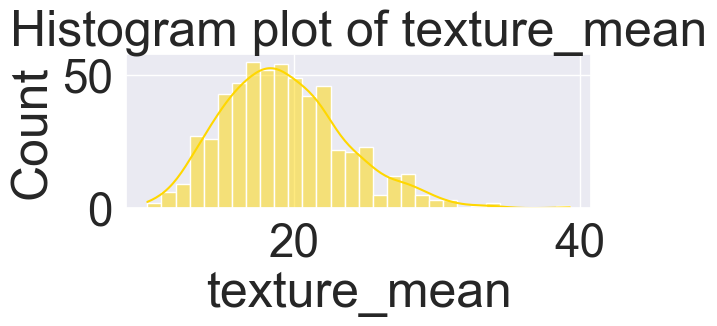

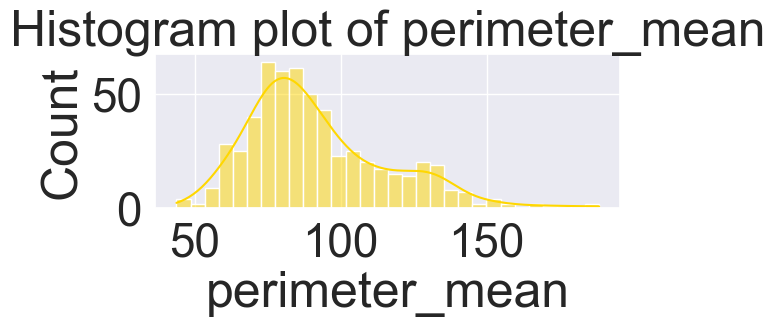

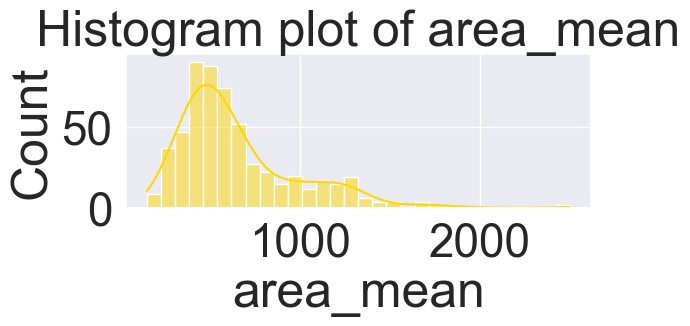

...

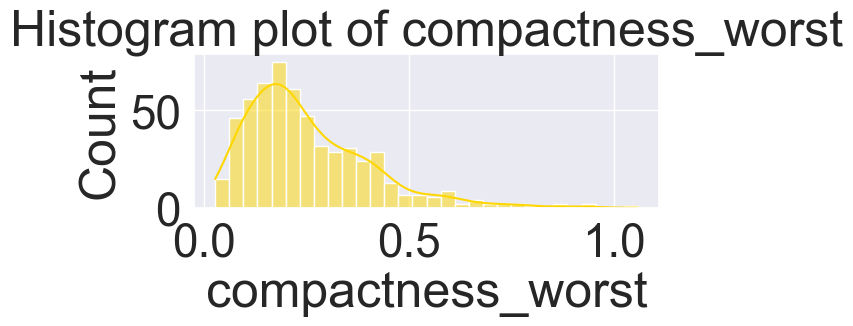

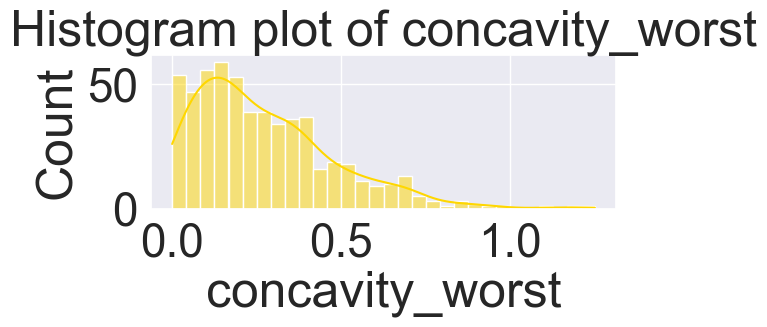

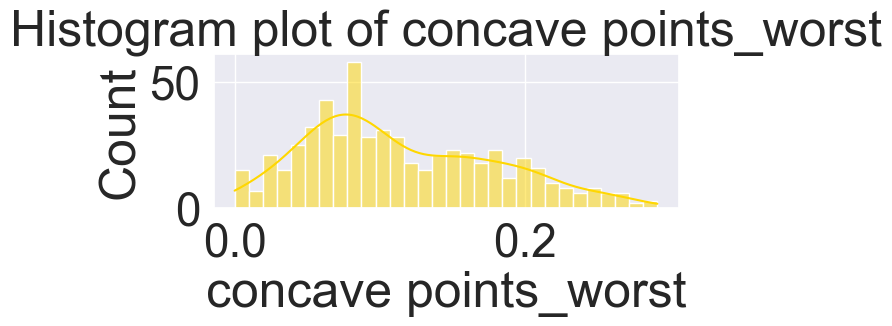

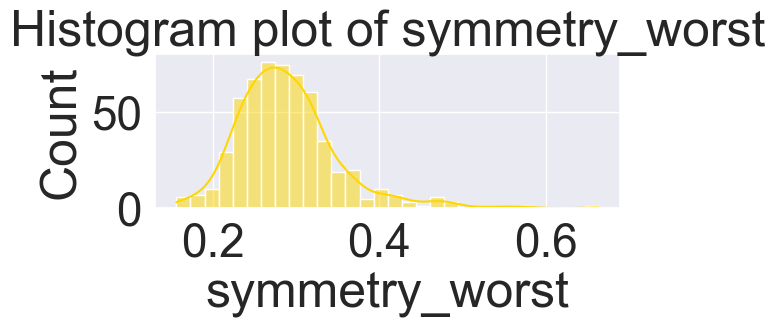

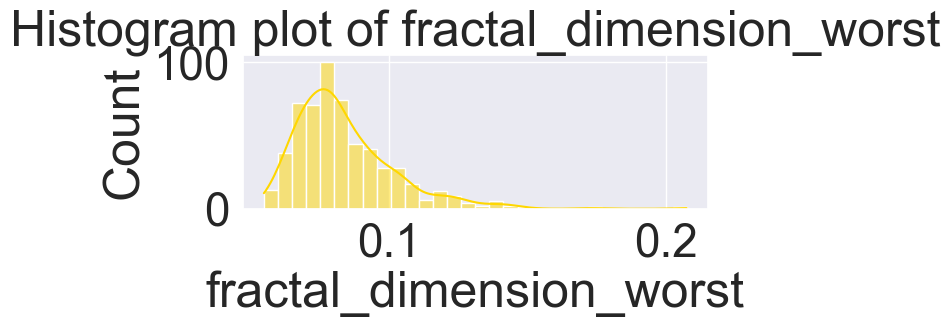

In [14]:
for col in numerical_col:
    plt.figure(figsize=(6,2))
    sns.histplot(x=breast_dataset[col],color="gold",kde=True ,bins=30)
    plt.title(f"Histogram plot of {col}")
    plt.show()

# Preprocessing :

# 1. Handle null values:

In [15]:
breast_dataset.isna().sum()

id                         0
diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

its clearly watching you not missing value in dataset

# 2. Handle category values :

In [16]:
lb = LabelEncoder()
lb
breast_dataset.diagnosis= lb.fit_transform(breast_dataset.diagnosis)

In [17]:
breast_dataset.diagnosis[15:30]

15    1
16    1
17    1
18    1
19    0
20    0
21    0
22    1
23    1
24    1
25    1
26    1
27    1
28    1
29    1
Name: diagnosis, dtype: int32

# 3. detect Outlines and Remove

In [18]:
for i in breast_dataset:
    q1 = breast_dataset[i].quantile(0.25)
    q3 = breast_dataset[i].quantile(0.75)
    
    iqr = q3-q1 
    
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    
    breast_dataset = breast_dataset[(breast_dataset[i] >= lower_bound) & ( breast_dataset[i] <= upper_bound)]
    

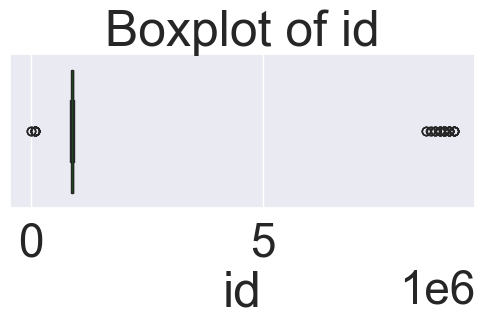

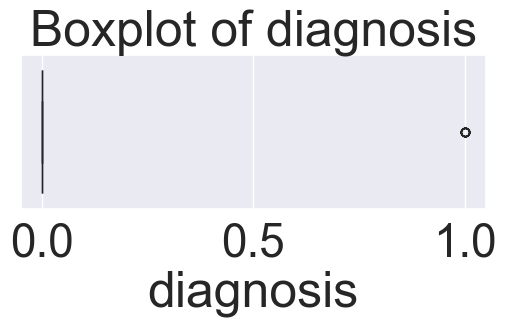

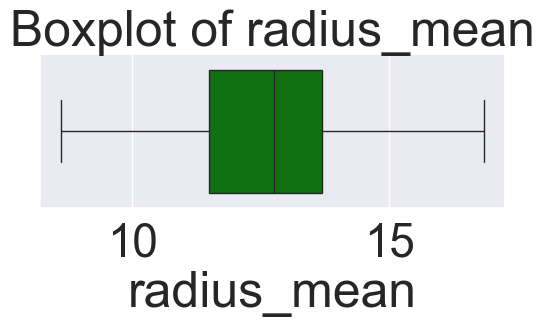

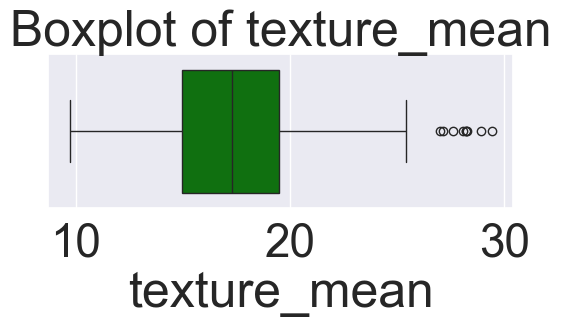

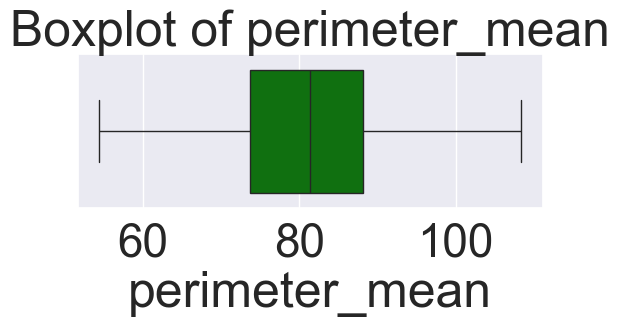

...

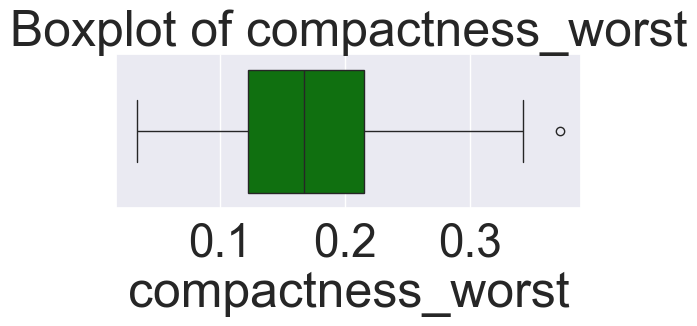

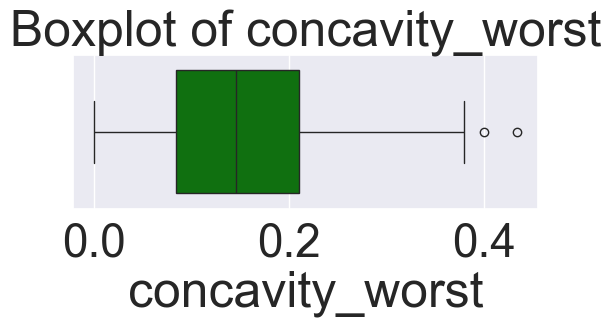

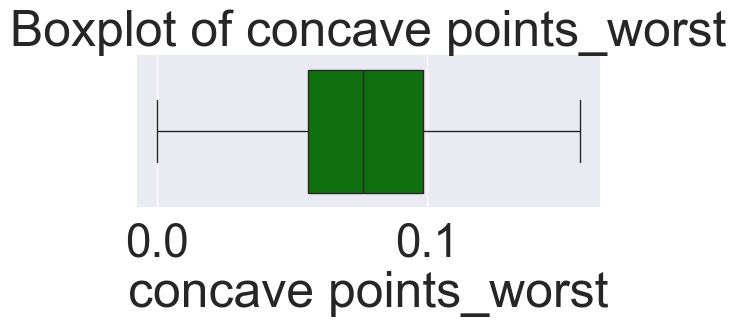

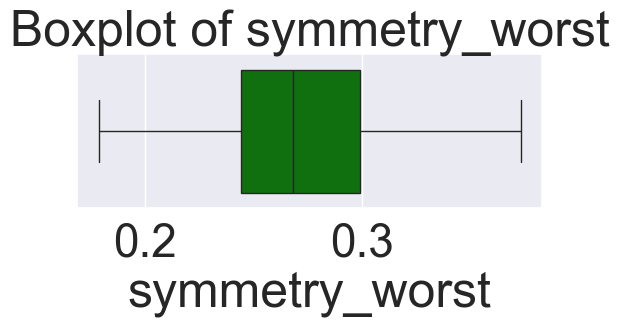

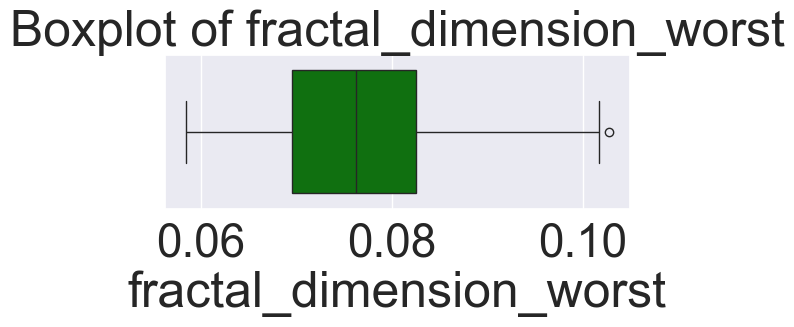

In [25]:
for col in breast_dataset:
    plt.figure(figsize=(6, 2))
    sns.boxplot(x=breast_dataset[col], color="green")
    plt.title(f"Boxplot of {col}")
    plt.tight_layout()
    plt.show()

import warnings 
warnings.simplefilter("ignore")

# Feature Engineering:

In [20]:
x = breast_dataset.drop("diagnosis",axis=1)
y = breast_dataset.diagnosis

x_train,x_test,y_train,y_test = train_test_split(x ,y, test_size=0.2 , random_state=42)


In [21]:
y.value_counts()

diagnosis
0    219
1     14
Name: count, dtype: int64

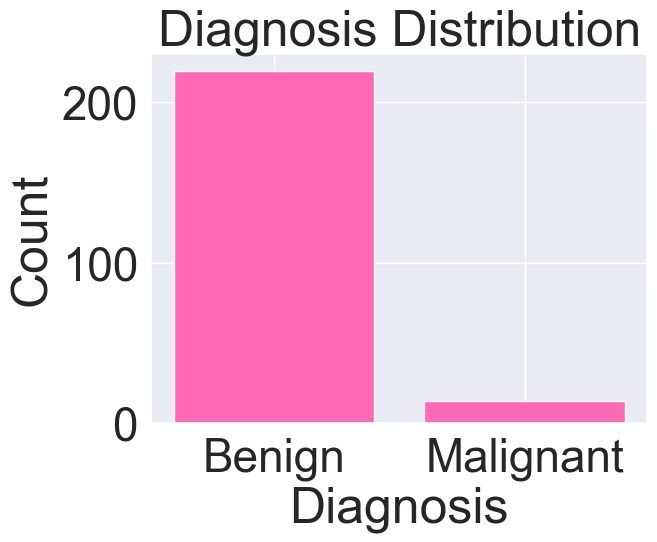

In [22]:
target_var = y.map({0: "Benign", 1: "Malignant"}).value_counts()

plt.bar(target_var.index, target_var.values, color="hotpink")
plt.xlabel("Diagnosis")
plt.ylabel("Count")
plt.title("Diagnosis Distribution")
plt.show()








# Feature Scaling

In [23]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)

 # Visualize decision boundary using 2D PCA

In [31]:
# Step 2: PCA on full scaled data
pca = PCA(n_components=2)
X_2d = pca.fit_transform(x_scaled)

In [32]:
# Step 3: Now split PCA data and labels together

x_train, x_test, y_train, y_test = train_test_split(x_scaled, y, test_size=0.2, random_state=42)

X_train_2d, X_test_2d, y_train_2d, y_test_2d = train_test_split(X_2d, y, test_size=0.2, random_state=42)

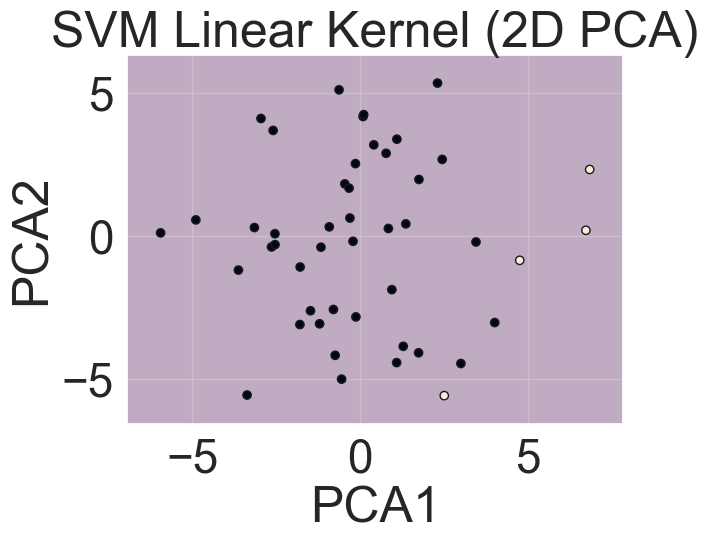

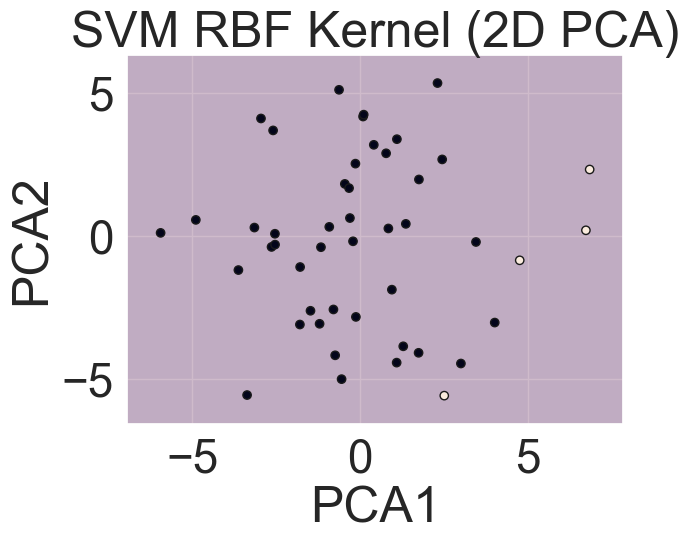

In [37]:
# Step 4: Train SVMs on 2D data

svm_linear_2d = SVC(kernel="linear", C=1).fit(X_train_2d, y_train_2d)
svm_rbf_2d = SVC(kernel="rbf", gamma="scale", C=1).fit(X_train_2d, y_train_2d)

# Step 5: Plot decision boundary
def plot_decision_boundary(model, X, y, title):
    h = .02
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    plt.contourf(xx, yy, Z, alpha=0.3)
    plt.scatter(X[:, 0], X[:, 1], c=y, edgecolors="k")
    plt.title(title)
    plt.xlabel("PCA1")
    plt.ylabel("PCA2")
    plt.show()


plot_decision_boundary(svm_linear_2d, X_test_2d, y_test_2d, "SVM Linear Kernel (2D PCA)")
plot_decision_boundary(svm_rbf_2d, X_test_2d, y_test_2d, "SVM RBF Kernel (2D PCA)")


# evaluation:

In [38]:

param_grid = {
    "C": [0.1, 1, 10],
    "gamma": ["scale", 0.001, 0.01, 0.1]
}

# Create GridSearchCV
grid = GridSearchCV(SVC(kernel="rbf"), param_grid, cv=5)
grid.fit(x_train, y_train)

print("Best Parameters:", grid.best_params_)

Best Parameters: {'C': 10, 'gamma': 0.01}


In [47]:
y_pred = grid.predict(x_test)

In [48]:
acc = accuracy_score(y_test, y_pred)
print("Accuracy:", acc)

Accuracy: 0.9148936170212766


Confusion Matrix:
 [[43  0]
 [ 4  0]]


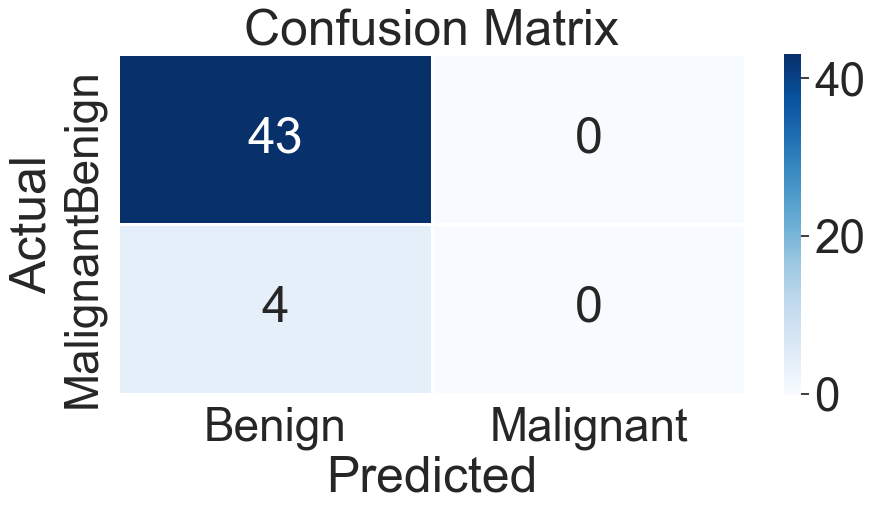

In [49]:
# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n",cm )

plt.figure(figsize=(10,6))
sns.heatmap(cm, annot=True, linewidths=2, fmt="d", cmap="Blues", xticklabels=["Benign", "Malignant"], yticklabels=["Benign", "Malignant"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.tight_layout()
plt.show()

In [50]:
# Classification Report
print("Classification Report:\n", classification_report(y_test, y_pred))

Classification Report:
               precision    recall  f1-score   support

           0       0.91      1.00      0.96        43
           1       0.00      0.00      0.00         4

    accuracy                           0.91        47
   macro avg       0.46      0.50      0.48        47
weighted avg       0.84      0.91      0.87        47



In [51]:


cv_scores = cross_val_score(grid.best_estimator_, x_scaled, y, cv=5)
print("Cross-Validation Accuracy: {:.2f} ± {:.2f}".format(cv_scores.mean(), cv_scores.std()))


Cross-Validation Accuracy: 0.97 ± 0.02


In [52]:

breast_dataset

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [53]:
new_data_scaled = [14.5, 20.5, 95.5, 600, 0.1, 0.2, 0.3, 0.1, 0.2, 0.07, 
                   0.3, 1.2, 2.0, 25.0, 0.01, 0.04, 0.05, 0.02, 0.02, 0.01,
                   16.0, 30.0, 120.0, 900, 0.14, 0.4, 0.5, 0.2, 0.3, 0.08]

new_data_scaled.append(0)

new_data_scaled_reshaped = [new_data_scaled]

new_prediction = grid.best_estimator_.predict(new_data_scaled_reshaped)
print(new_prediction)


[0]


 **Conclusion**
 
In this analysis, we built a Support Vector Machine (SVM) model to classify breast cancer tumors as malignant or benign using the Breast Cancer Wisconsin dataset. The dataset was standardized and visualized using PCA, enabling us to plot decision boundaries for both linear and RBF kernels in two dimensions.

We then performed hyperparameter tuning using GridSearchCV to find the optimal values of C and gamma. The final model achieved a high test accuracy and showed strong performance across cross-validation folds.

**Key Takeaways:**

PCA helped visualize class separability in 2D.

RBF kernel SVM with tuned parameters outperformed the linear model.

The model achieved excellent classification performance, making it suitable for early detection tasks in healthcare.

In [ ]:
Thank Yo